In [59]:
import numpy as np
from scipy.fft import dst, dct, fft, fftfreq
import pandas as pd
import os

import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('ggplot') 
from PIL import Image

STYLE = "#ffffff"

from sklearn.base import TransformerMixin
from sklearn.preprocessing import StandardScaler, MinMaxScaler

In [60]:
# list(plt.style.available)

In [61]:
def load_images(path, samples):
    data = []
    for index, file in enumerate(os.listdir(path)):
        if index < samples + 1 and file[-4:] == ".png":
            image = Image.open("data/image-data/" + file)
            image.load()
            data.append(np.asarray(image, dtype="int32"))
    return data

data = load_images("data/image-data", 1)

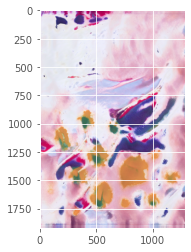

In [62]:
plt.imshow(data[0])

In [63]:
class NDStandardScaler(TransformerMixin):
    def __init__(self, **kwargs):
        self._scaler = MinMaxScaler((-128,127), copy=True, **kwargs)
        self._orig_shape = None

    def fit(self, X, **kwargs):
        X = np.array(X)
        # Save the original shape to reshape the flattened X later
        # back to its original shape
        if len(X.shape) > 1:
            self._orig_shape = X.shape[1:]
        X = self._flatten(X)
        self._scaler.fit(X, **kwargs)
        return self

    def transform(self, X, **kwargs):
        X = np.array(X)
        X = self._flatten(X)
        X = self._scaler.transform(X, **kwargs)
        X = self._reshape(X)
        return abs(X

    def _flatten(self, X):
        # Reshape X to <= 2 dimensions
        if len(X.shape) > 2:
            n_dims = np.prod(self._orig_shape)
            X = X.reshape(-1, n_dims)
        return X

    def _reshape(self, X):
        # Reshape X back to it's original shape
        if len(X.shape) >= 2:
            X = X.reshape(-1, *self._orig_shape)
        return X # np.around(X).astype(int)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


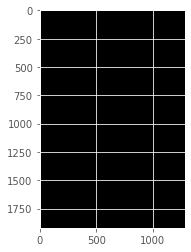

In [64]:
scaler = NDStandardScaler()

scaled_data = scaler.fit_transform(data).astype("int")

plt.imshow(scaled_data[0][:,:,:])

In [42]:
data = data[0]

In [6]:
scaler = NDStandardScaler()

scaled_data = scaler.fit_transform(data)

In [7]:
scaled_data.shape

(1920, 1280, 3)

In [8]:
def fourier_transform_rgb(image):
    f_size = 25
    transformed_channels = []
    for i in range(3):
        rgb_fft = np.fft.fftshift(np.fft.fft2((image[:, :, i])))
        rgb_fft[:225, 235:237] = 1
        rgb_fft[-225:,235:237] = 1
        transformed_channels.append(abs(np.fft.ifft2(rgb_fft)))
    
    final_image = np.dstack([transformed_channels[0].astype(int), 
                             transformed_channels[1].astype(int), 
                             transformed_channels[2].astype(int)])
    
    fig, ax = plt.subplots(1, 2, figsize=(17,12))
    ax[0].imshow(image)
    ax[0].set_title('Original Image', fontsize = f_size)
    ax[0].set_axis_off()
    
    ax[1].imshow(final_image)
    ax[1].set_title('Transformed Image', fontsize = f_size)
    ax[1].set_axis_off()
    
    fig.tight_layout()

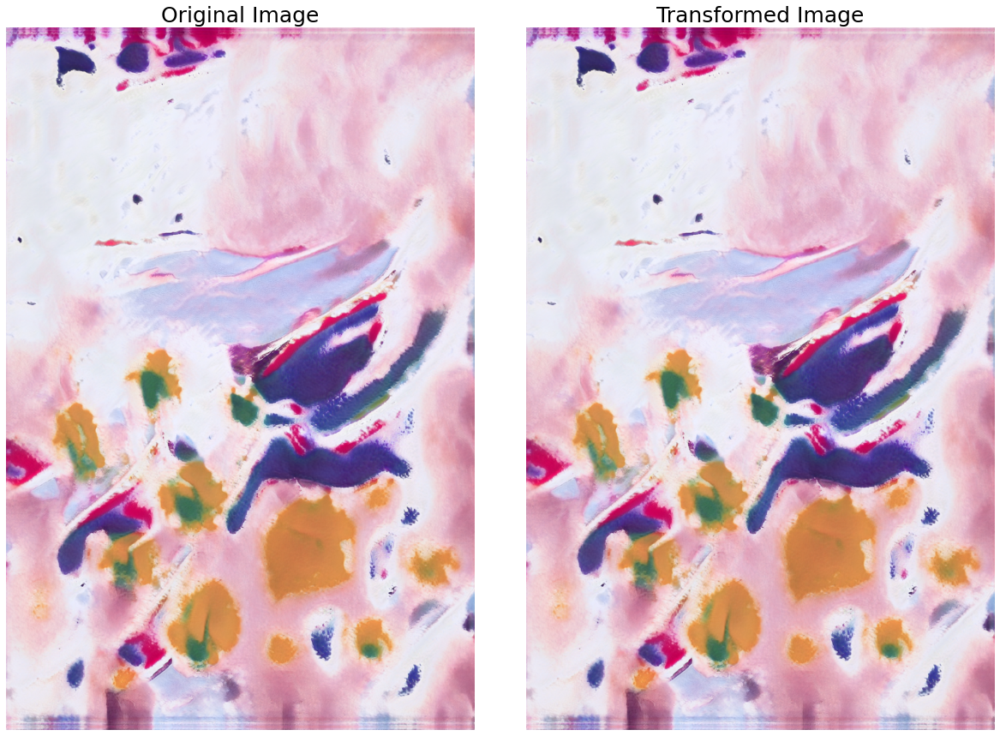

In [26]:
fourier_transform_rgb(data)

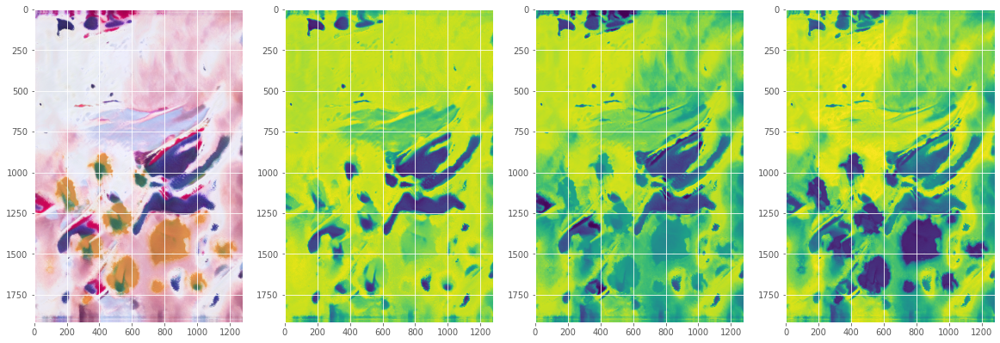

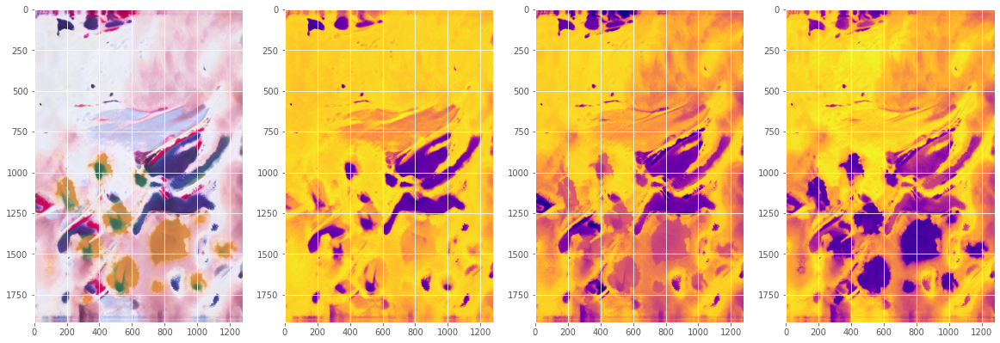

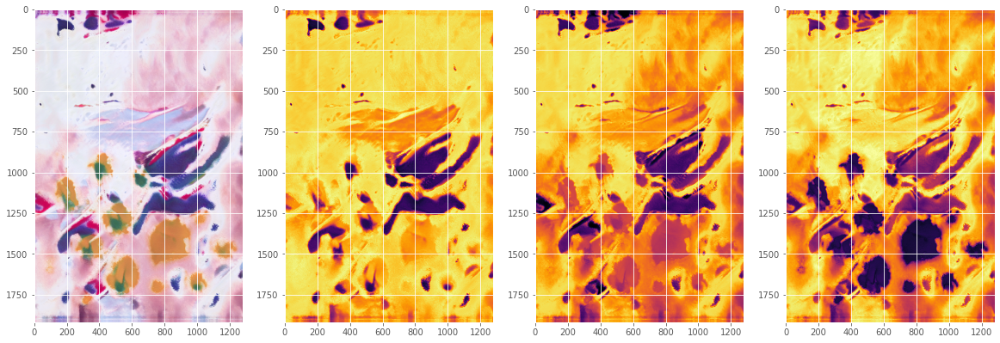

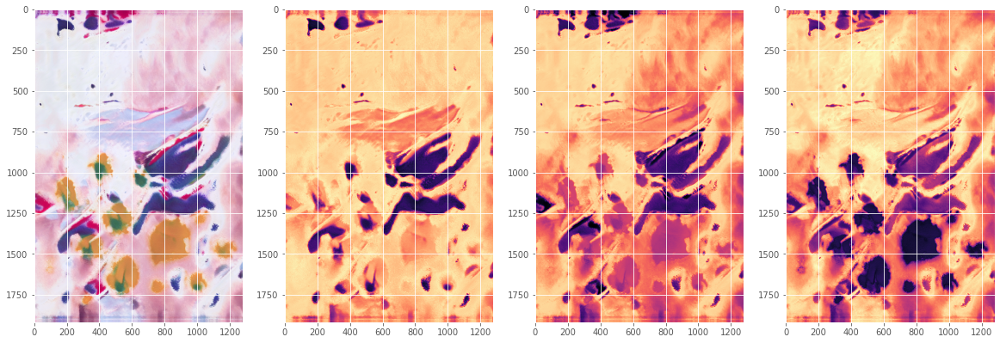

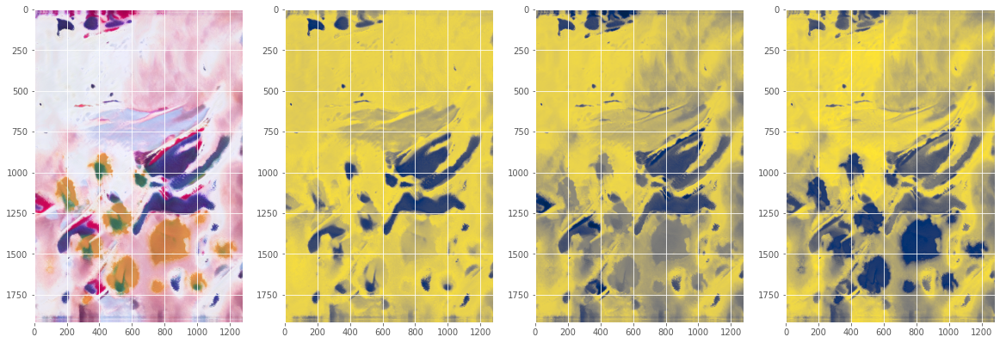

In [10]:
for style in ['viridis', 'plasma', 'inferno', 'magma', 'cividis']:
    fig, axes = plt.subplots(1, 4, figsize=(20, 20), facecolor = (STYLE))
    axes[0].imshow(data, cmap=style)
    axes[1].imshow(data[:,:,0], cmap=style)
    axes[2].imshow(data[:,:,1], cmap=style)
    axes[3].imshow(data[:,:,2], cmap=style)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


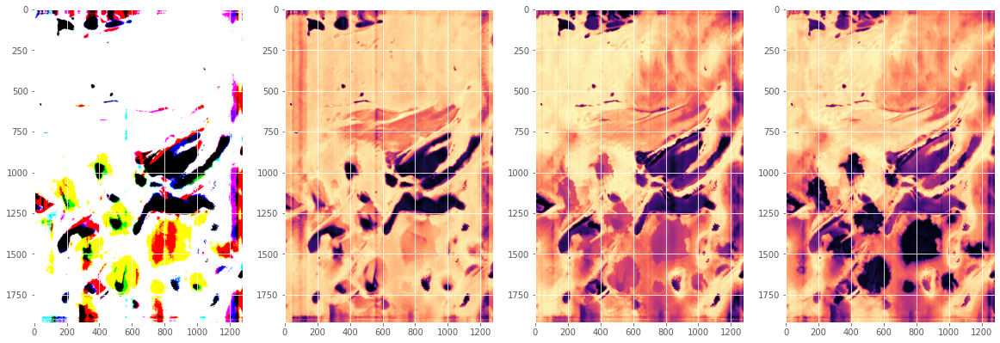

In [11]:
fig, axes = plt.subplots(1, 4, figsize=(20, 20), facecolor = (STYLE))

axes[0].imshow(scaled_data, cmap="magma")
axes[1].imshow(scaled_data[:,:,0], cmap="magma")
axes[2].imshow(scaled_data[:,:,1], cmap="magma")
axes[3].imshow(scaled_data[:,:,2], cmap="magma") #  [ 'viridis', 'plasma', 'inferno', 'magma', 'cividis']

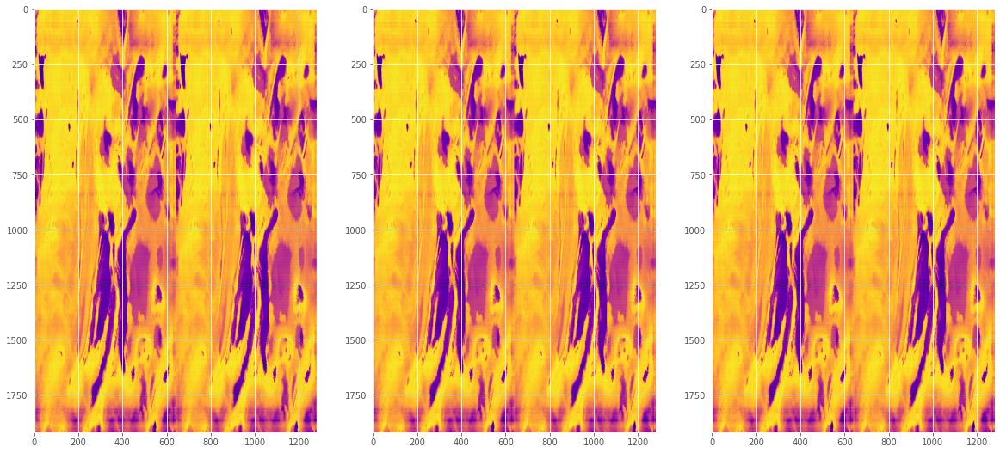

In [12]:
fig, axes = plt.subplots(1, 3, figsize=(20, 20), facecolor = (STYLE))

prueba = np.concatenate((scaled_data[:,:,0].T, scaled_data[:,:,1].T, scaled_data[:,:,2].T), axis = 1).reshape((1920, 1280, 3))

axes[0].imshow(prueba[:,:,0], cmap="plasma")
axes[1].imshow(prueba[:,:,1], cmap="plasma")
axes[2].imshow(prueba[:,:,2], cmap="plasma")

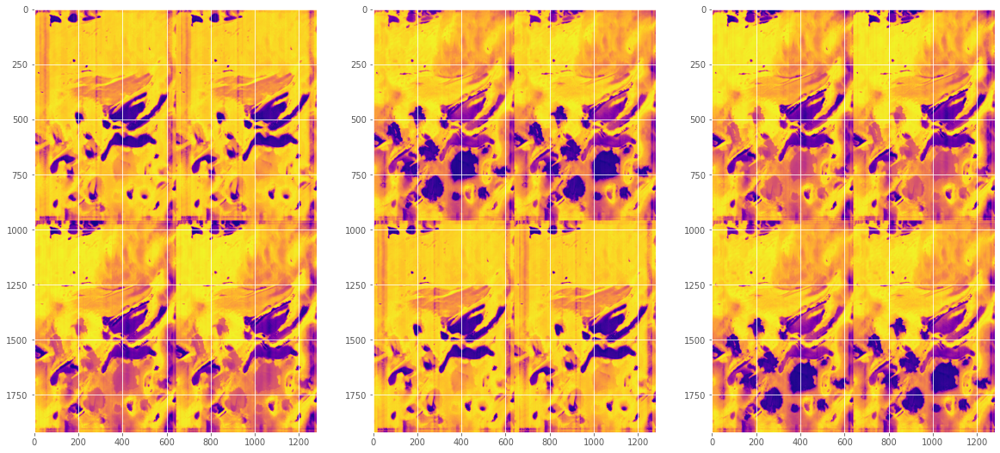

In [13]:
fig, axes = plt.subplots(1, 3, figsize=(20, 20), facecolor = (STYLE))

test = np.concatenate((prueba[:,:,0].T, prueba[:,:,1].T, prueba[:,:,2].T), axis = 1).reshape((1920, 1280, 3))

axes[0].imshow(test[:,:,0], cmap="plasma")
axes[1].imshow(test[:,:,1], cmap="plasma")
axes[2].imshow(test[:,:,2], cmap="plasma")

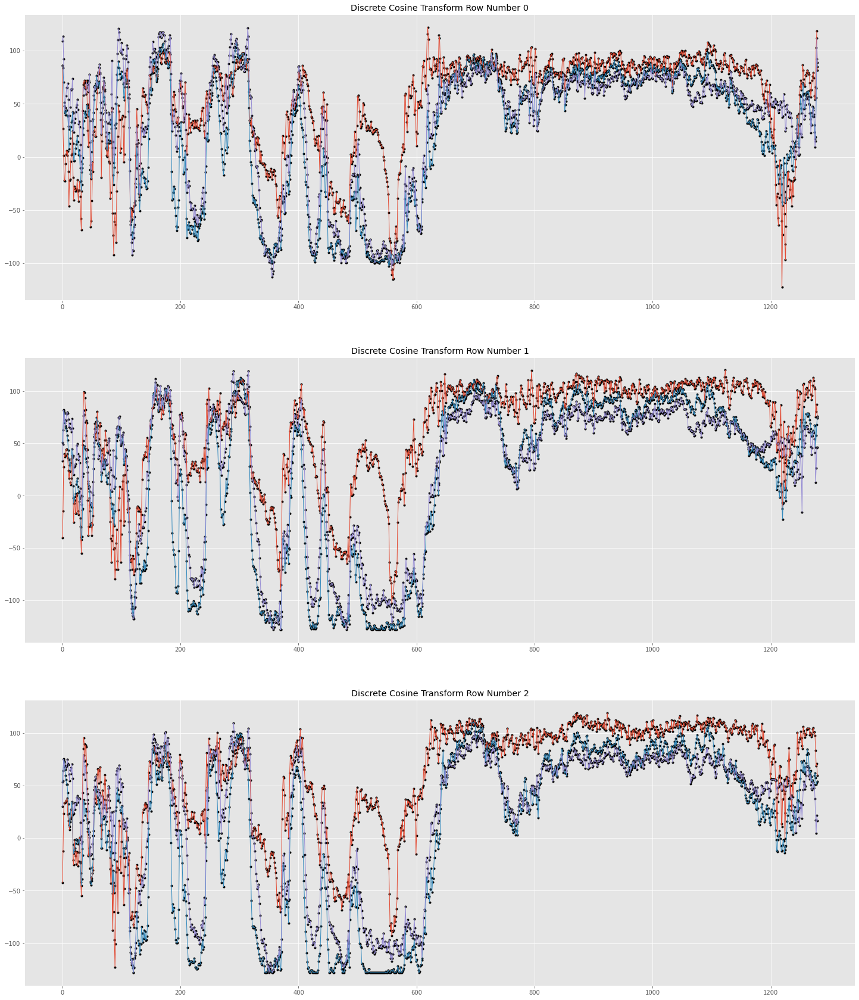

In [14]:
STYLE = "#ffffff"

rows = 3

fig, axes = plt.subplots(rows, 1, figsize=(25, rows * 10), facecolor = (STYLE))

for row in range(rows):
    axes[row].plot(scaled_data[row], linewidth=1); axes[row].set_title(f'Row Number {row}')
    axes[row].scatter(np.repeat(np.arange(scaled_data[row].shape[0]),3).reshape((scaled_data[row].shape[0], 3)), # Creates 3 arrays for the Xs
                      scaled_data[row],
                      linewidth=1,
                      marker = '.',
                      color= "black"); axes[row].set_title(f'Discrete Cosine Transform Row Number {row}')

In [15]:
pd.DataFrame(scaled_data[0]).T.head(3)

,0,1,2,3,4,5,6,7,8,9,...,1270,1271,1272,1273,1274,1275,1276,1277,1278,1279
0,86.285714,26.743590,1.661017,-22.268293,-22.414062,-6.295455,2.465116,6.210526,1.431818,5.295455,...,72.245399,76.000000,79.484472,74.454545,57.454545,53.920732,65.670886,102.791139,118.720779,81.464286
1,86.059633,83.595745,70.574468,47.862069,42.000000,39.792208,43.465517,43.800847,39.106383,38.730769,...,38.304348,47.214724,46.223602,39.888199,30.006135,17.272727,18.867089,55.987342,92.295858,85.018293
2,109.246835,113.490066,92.000000,51.145570,43.603774,46.223602,57.601266,65.280255,65.280255,69.264151,...,42.000000,47.666667,43.931818,38.046512,23.466165,9.460938,15.048780,64.857143,111.612069,88.750000


In [16]:
def gen(x):
   i = 2
   for n in range(x + 1):
       yield i
       i <<= 1

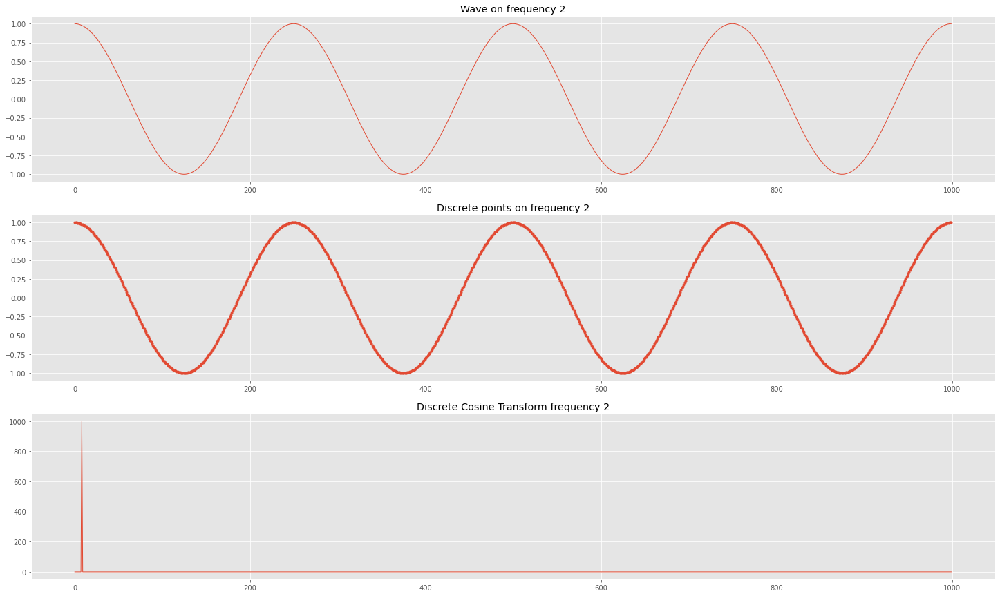

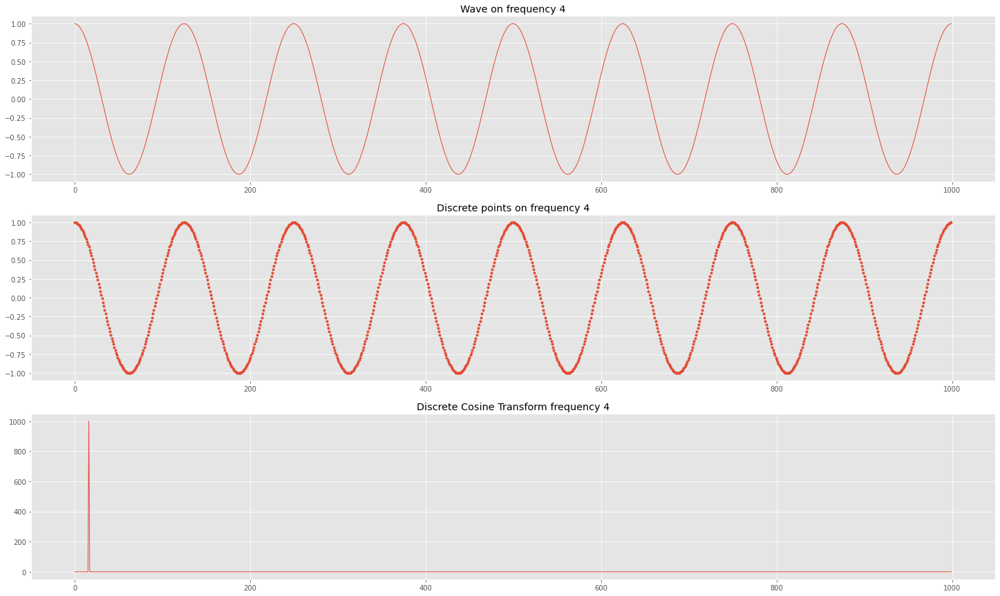

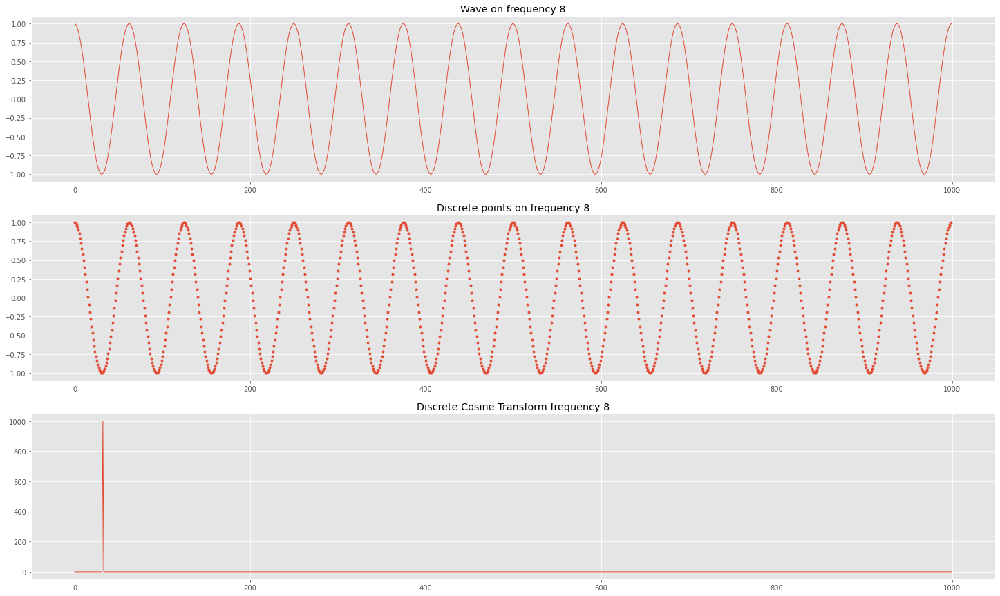

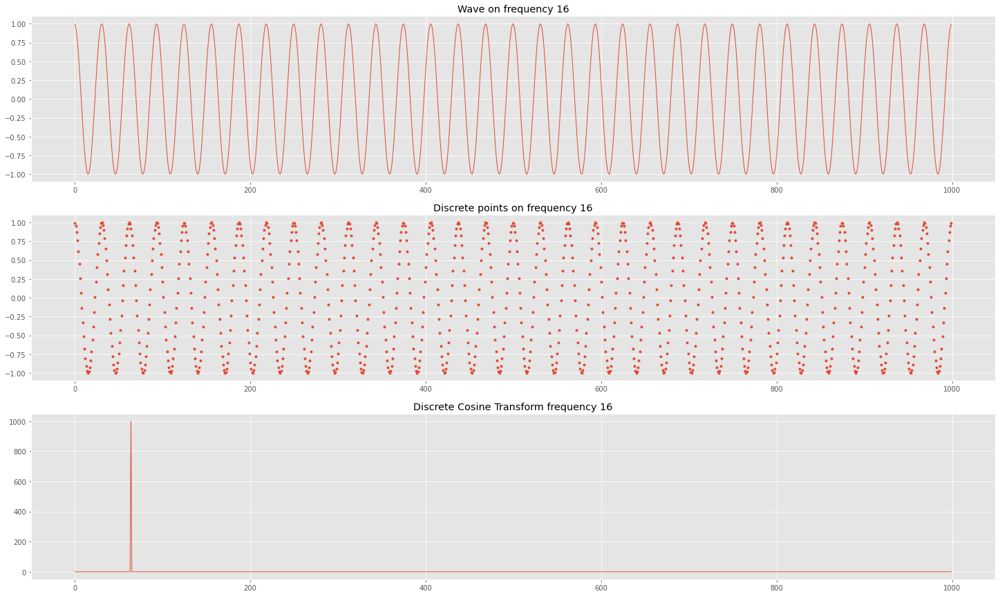

In [17]:
for frequency in list(gen(3)): #[0.25, 0.5, 1 , 2 , 4 , 8 , 16, 128, 512, 2048]:
    
    rango = 1000
    x = np.arange(rango)
    y = np.cos(((2*x+1)*np.pi*frequency)/rango*2) # amplitud?

    array = np.array((x,y)).T

    transform = dct(y, axis=0)

    fig, axes = plt.subplots(3, 1, figsize=(25, 15), facecolor = (STYLE))

    axes[0].plot(array[:,0], array[:,1], linewidth=1); axes[0].set_title(f'Wave on frequency {frequency}')
    axes[1].scatter(array[:,0], array[:,1], linewidth=1, marker = "."); axes[1].set_title(f'Discrete points on frequency {frequency}')
    axes[2].plot(transform, linewidth=1); axes[2].set_title(f'Discrete Cosine Transform frequency {frequency}')

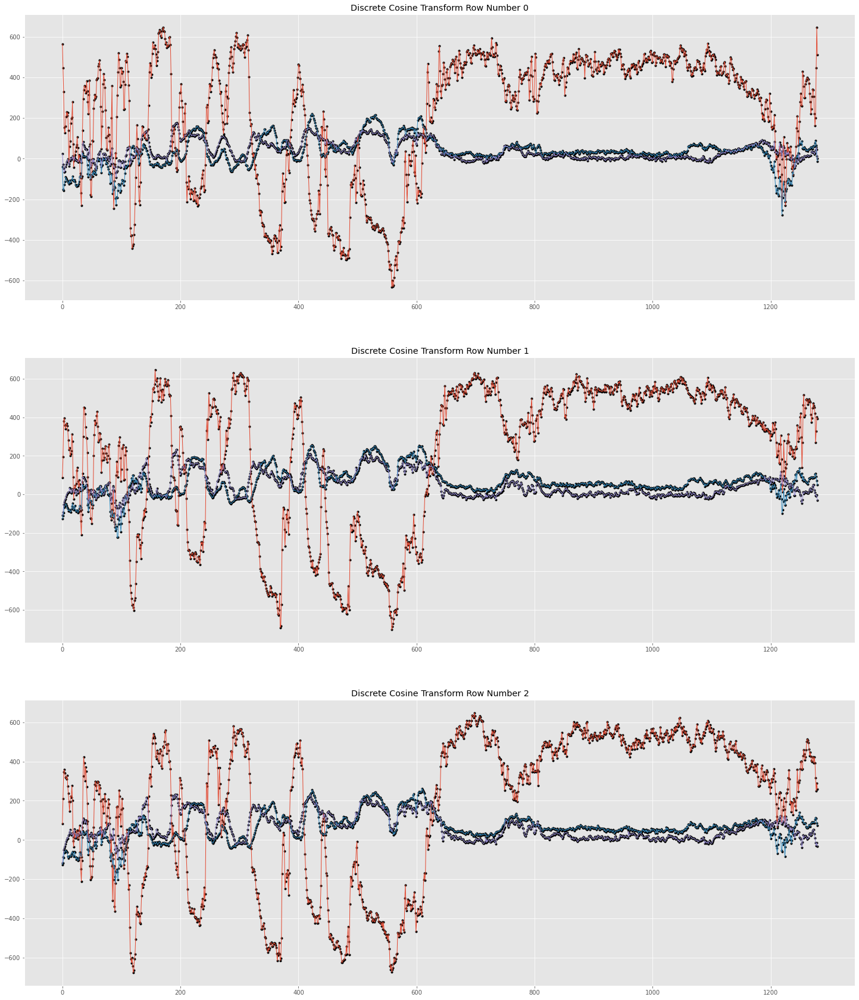

In [18]:
rows= 3

fig, axes = plt.subplots(rows, 1, figsize=(25, rows * 10), facecolor = (STYLE))

for row in range(rows):
    discrete_cosine_transform = dct(scaled_data[row])
    axes[row].plot(discrete_cosine_transform, linewidth=1); axes[row].set_title(f'Discrete Cosine Transform Row Number {row}')
    axes[row].scatter(np.repeat(np.arange(discrete_cosine_transform.shape[0]),3).reshape((1280, 3)), # Creates 3 arrays for the Xs
                      discrete_cosine_transform,
                      linewidth=1,
                      marker = '.',
                      color= "black"); axes[row].set_title(f'Discrete Cosine Transform Row Number {row}')

In [19]:
discrete_cosine_transform = dct(data[0])

discrete_cosine_transform.shape

(1280, 3)

In [20]:
discrete_cosine_transform = dst(scaled_data)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


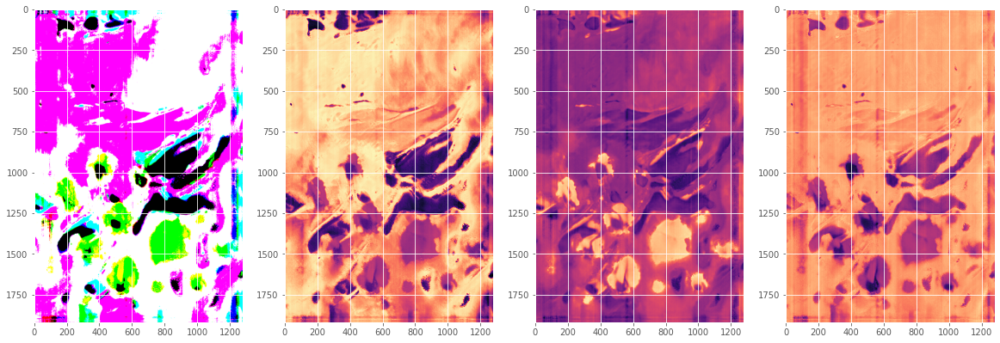

In [21]:
fig, axes = plt.subplots(1, 4, figsize=(20, 20), facecolor = (STYLE))

discrete_sine_transform = dst(scaled_data)

axes[0].imshow(discrete_sine_transform, cmap="magma")
axes[1].imshow(discrete_sine_transform[:,:,0], cmap="magma")
axes[2].imshow(discrete_sine_transform[:,:,1], cmap="magma")
axes[3].imshow(discrete_sine_transform[:,:,2], cmap="magma") #  [ 'viridis', 'plasma', 'inferno', 'magma', 'cividis']

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


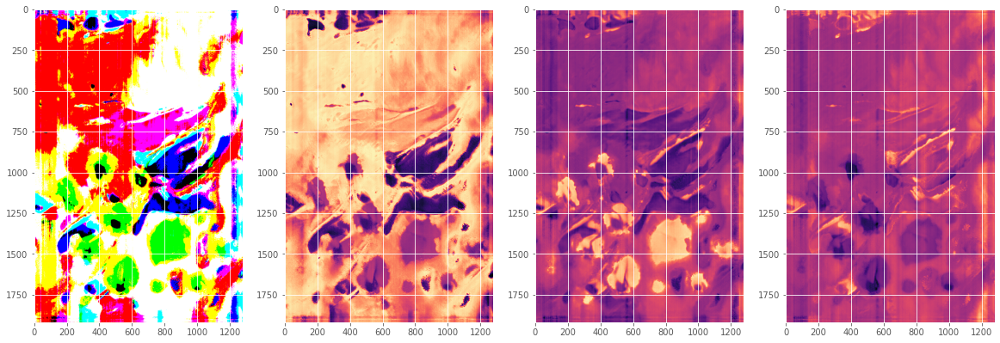

In [22]:
fig, axes = plt.subplots(1, 4, figsize=(20, 20), facecolor = (STYLE))

discrete_cosine_transform = dct(scaled_data)

axes[0].imshow(discrete_cosine_transform, cmap="magma")
axes[1].imshow(discrete_cosine_transform[:,:,0], cmap="magma")
axes[2].imshow(discrete_cosine_transform[:,:,1], cmap="magma")
axes[3].imshow(discrete_cosine_transform[:,:,2], cmap="magma") #  [ 'viridis', 'plasma', 'inferno', 'magma', 'cividis']

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


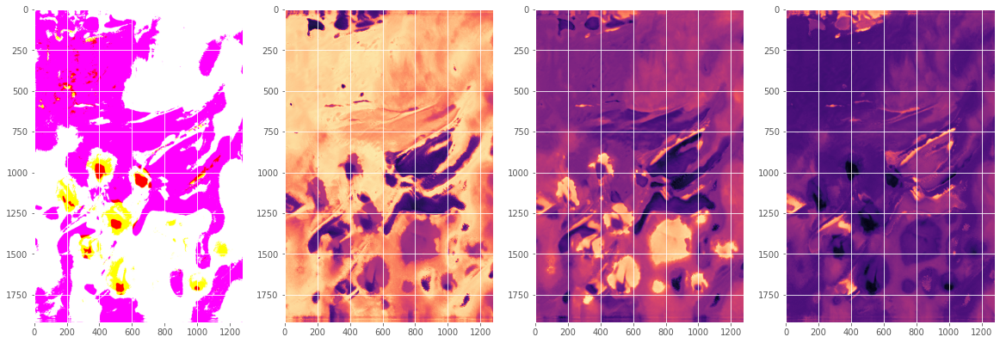

In [23]:
fig, axes = plt.subplots(1, 4, figsize=(20, 20), facecolor = (STYLE))

discrete_cosine_transform = dct(data)

axes[0].imshow(discrete_cosine_transform, cmap="magma")
axes[1].imshow(discrete_cosine_transform[:,:,0], cmap="magma")
axes[2].imshow(discrete_cosine_transform[:,:,1], cmap="magma")
axes[3].imshow(discrete_cosine_transform[:,:,2], cmap="magma")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


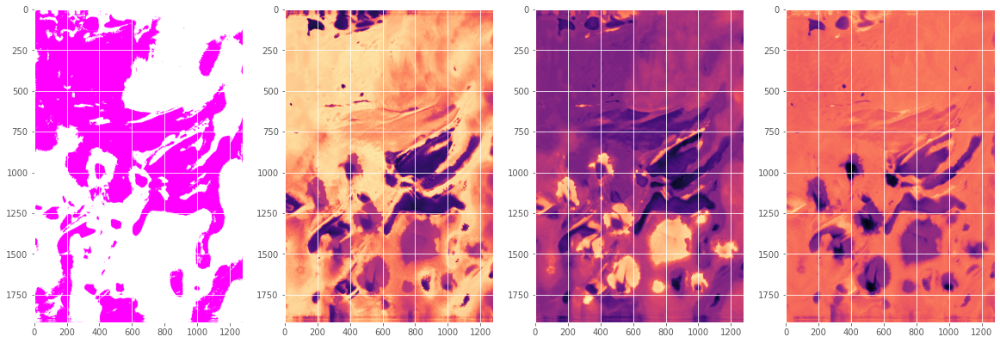

In [24]:
fig, axes = plt.subplots(1, 4, figsize=(20, 20), facecolor = (STYLE))

discrete_cosine_transform = dst(data)

axes[0].imshow(discrete_cosine_transform, cmap="magma")
axes[1].imshow(discrete_cosine_transform[:,:,0], cmap="magma")
axes[2].imshow(discrete_cosine_transform[:,:,1], cmap="magma")
axes[3].imshow(discrete_cosine_transform[:,:,2], cmap="magma")

In [25]:
# fig, axes = plt.subplots(1, 4, figsize=(20, 20), facecolor = (STYLE))

discrete_cosine_transform = fft(data)

axes[0].plot(discrete_cosine_transform, cmap="magma")
axes[1].plot(discrete_cosine_transform[:,:,0], cmap="magma")
axes[2].plot(discrete_cosine_transform[:,:,1], cmap="magma")
axes[3].plot(discrete_cosine_transform[:,:,2], cmap="magma")

discrete_cosine_transform.shape

ValueError: x and y can be no greater than 2D, but have shapes (1920,) and (1920, 1280, 3)

In [ ]:
## convos

In [ ]:
def compute_convolution(img, kernel):
    # Parameters
    kernel = np.array(kernel)
    kernel_height, kernel_width = kernel.shape

    img = np.squeeze(img) # Removes dimensions of size 1
    img_height, img_width = img.shape
    
    array = []

    for x in range(img_height - kernel_height):
        arr = []
        
        for y in range(img_width - kernel_width):
            
            a = np.multiply(img[x: x + kernel_height, y: y + kernel_width], kernel)
            arr.append(a.sum())
            
        array.append(arr)
        
    return array

In [ ]:
identity_kernel = [
    [0, 0, 0],
    [0, 1, 0],
    [0, 0, 0]
]

In [ ]:
output = compute_convolution(data[:,:,0], identity_kernel)

plt.imshow(data, cmap='gray')
plt.show()

plt.imshow(output, cmap='gray')
plt.show()

In [ ]:
def plot_convolution(img, kernel, activation=False):
    ''' The following printing function ease the visualization'''
    
    img = np.squeeze(img)
    output_img = compute_convolution(img, kernel)
    if activation:
        output_img = np.maximum(output_img, 0)
    
    plt.figure(figsize=(10, 5))
    
    ax1 = plt.subplot2grid((3,3),(0,0), rowspan=3)
    ax1.imshow(img, cmap='gray')
    ax1.title.set_text('Input image')
    
    ax2 = plt.subplot2grid((3,3),(1, 1))
    ax2.imshow(kernel, cmap='gray')
    ax2.title.set_text('Kernel')    
    
    ax3 = plt.subplot2grid((3,3),(0, 2), rowspan=3)
    ax3.imshow(output_img, cmap='gray')
    ax3.title.set_text('Output image')    

    for ax in [ax1, ax2, ax3]:
        ax.axes.get_xaxis().set_visible(False)
        ax.axes.get_yaxis().set_visible(False)
        
    plt.show()

In [ ]:
kernel_2 = [
    [-1, -1, -1],
    [0, 0, 0],   
    [1, 1, 1],
]

kernel_3 = [
    [-1, 0, 1],
    [-1, 0, 1],
    [-1, 0, 1]
]

kernel_4 = [
    [1, 0, -1],
    [1, 0, -1],
    [1, 0, -1]
]

In [ ]:
plot_convolution(data[:,:,0], kernel_2, activation=True)
plot_convolution(data[:,:,0], kernel_3, activation=True)
plot_convolution(data[:,:,0], kernel_4, activation=True)

In [ ]:
plot_convolution(data[:,:,1], kernel_2, activation=True)
plot_convolution(data[:,:,1], kernel_3, activation=True)
plot_convolution(data[:,:,1], kernel_4, activation=True)

In [ ]:
plot_convolution(data[:,:,2], kernel_2, activation=True)
plot_convolution(data[:,:,2], kernel_3, activation=True)
plot_convolution(data[:,:,2], kernel_4, activation=True)